### Import packages and datasets

In [5]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
#from pandas_profiling import ProfileReport
import missingno as msno
import janitor
from rfpimp import *
import plotly.express as px


pd.set_option('display.max_columns', 500)
pd.set_option('display.max_rows', 500)

import warnings
warnings.filterwarnings('ignore')

In [3]:
trans_df = pd.read_csv('Data/train_transaction.csv')
trans_test_df = pd.read_csv('Data/test_transaction.csv')

In [9]:
id_df = pd.read_csv('Data/train_identity.csv')

In [6]:
trans_df.shape, trans_test_df.shape

((590540, 394), (506691, 393))

In [7]:
# correct data types
trans_df = trans_df.astype({'card1': 'object', 'card2': 'object', \
                            'card3': 'object', 'card4': 'object',\
                            'card5': 'object', 'card6': 'object',\
                           'addr1':'object', 'addr2': 'object',\
                           'M1': 'object', 'M2': 'object', 'M3': 'object','M4': 'object',\
                           'M5': 'object', 'M6': 'object', 'M7': 'object', 'M8': 'object', 'M9': 'object'})

trans_test_df = trans_test_df.astype({'card1': 'object', 'card2': 'object', \
                            'card3': 'object', 'card4': 'object',\
                            'card5': 'object', 'card6': 'object',\
                           'addr1':'object', 'addr2': 'object',\
                           'M1': 'object', 'M2': 'object', 'M3': 'object','M4': 'object',\
                           'M5': 'object', 'M6': 'object', 'M7': 'object', 'M8': 'object', 'M9': 'object'})

In [10]:
# rename and preprocessing
for i in range(12,39):
    col = 'id_'+ str(i)
    id_df[col] = id_df[col].astype('object')

### Exploratory data analysis
* see code in fraud_transaction_detection_exploratory_data_analysis

### Missing data 
#### Checking:
* Missing Value Pattern Checking: missingno package

#### Methods:
* Missing value rate
* indicator: Add an indicator for same missing pattern
* Impute (numerical):  missing rate < 10% (medium); missing_rate > 10% (mark as -1)
* Impute (categorical):  missing rate < 10% (mode); missing_rate > 10% (mark as NA)

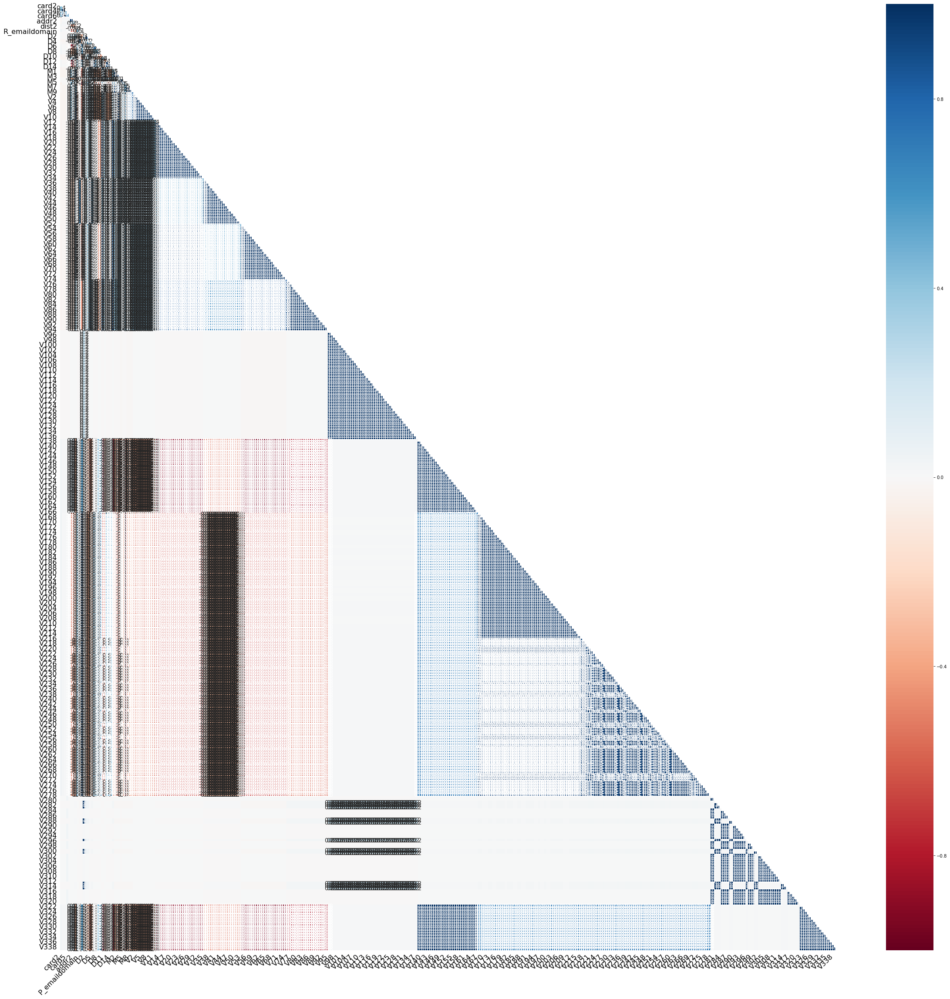

In [12]:
#Missing Value Pattern Checking
ax = msno.heatmap(trans_df, figsize=(40, 40))

In [13]:
#Missing value rate
trans_df.isnull().mean().sum()

161.82931892843837

In [14]:
def missing_at_random(col_start, col_end, missing_rate_high = True, impute_value = -1):
    #Add an indicator for missing value
    trans_df[col_start + '_'+ col_end + '_missing_indicator'] = trans_df[col_start].isnull().astype('int')
    col_name = trans_df.loc[: ,col_start:col_end].columns
    if missing_rate_high: 
        #Fill missing value with impute value (different from existing values)
        trans_df[col_name] = trans_df[col_name].fillna(impute_value)
        
    elif missing_rate_high == False:
        #Fill missing value with medium
        for col in col_name:
            trans_df[col] = trans_df[col].fillna(trans_df[col].median())

In [15]:
def missing_at_random_test(col_start, col_end, missing_rate_high = True, impute_value = -1):
    #Add an indicator for missing value
    trans_df[col_start + '_'+ col_end + '_missing_indicator'] = trans_df[col_start].isnull().astype('int')
    col_name = trans_df.loc[: ,col_start:col_end].columns
    if missing_rate_high: 
        #Fill missing value with impute value (different from existing values)
        trans_df[col_name] = trans_df[col_name].fillna(impute_value)
        
    elif missing_rate_high == False:
        #Fill missing value with medium
        for col in col_name:
            trans_df[col] = trans_df[col].fillna(trans_df[col].median())

In [16]:
missing_at_random('V1', 'V11')
missing_at_random('V12', 'V34')
missing_at_random('V35', 'V52')
missing_at_random('V53', 'V74')
missing_at_random('V75', 'V94')
missing_at_random('V95', 'V137', missing_rate_high = False)
missing_at_random('V138', 'V166')
missing_at_random('V167', 'V278')
missing_at_random('V281', 'V283', missing_rate_high = False)
missing_at_random('V285', 'V287', missing_rate_high = False)
missing_at_random('V290', 'V294', missing_rate_high = False)
missing_at_random('V302', 'V312', missing_rate_high = False)
missing_at_random('V316', 'V321', missing_rate_high = False)
missing_at_random('V322', 'V339')

In [17]:
col_names = ['V300', 'V301', 'V313', 'V314', 'V315']
trans_df['discrete_'+'1'+'_missing_indicator'] = trans_df['V300'].isnull().astype('int')
for col in col_names:
    trans_df[col] = trans_df[col].fillna(trans_df[col].median())

In [18]:
missing_at_random('M1', 'M3', impute_value = 'NA')

col_names = ['M4', 'M5', 'M6']
for col in col_names:
    trans_df[col] = trans_df[col].fillna('NA')
    
missing_at_random('M7', 'M9', impute_value = 'NA')


In [19]:
col_names = ['D2', 'D3', 'D4', 'D5', 'D6', 'D7', 'D8', 'D9', 'D10', 'D11', 'D12', 'D13', 'D14', 'D15']
for col in col_names:
    trans_df[col] = trans_df[col].fillna(-1)
trans_df['D1'] = trans_df['D1'].fillna(trans_df['D1'].median())

In [20]:
col_names = ['V279', 'V280', 'V284', 'V288', 'V289', 'V295', 'V296', 'V297', 'V298', 'V299']
trans_df['discrete_'+'2'+'_missing_indicator'] = trans_df['V289'].isnull().astype('int')
for col in col_names:
    trans_df[col] = trans_df[col].fillna(trans_df[col].median())

In [21]:
# Fill card1-6 with mode (categorical variables)
col_names = ['card1', 'card2', 'card3', 'card4', 'card5', 'card6']
for col in col_names:
    trans_df[col] = trans_df[col].fillna(trans_df[col].mode()[0])

In [22]:
col_names =['P_emaildomain', 'R_emaildomain']
for col in col_names:
    trans_df[col] = trans_df[col].fillna('NA')

In [23]:
col_names =['dist1', 'dist2']
for col in col_names:
    trans_df[col] = trans_df[col].fillna(-1)

In [24]:
col_names = ['addr1', 'addr2']
trans_df['addr_missing_indicator'] = trans_df['addr1'].isnull().astype('int')
for col in col_names:
    trans_df[col] = trans_df[col].fillna('NA')

In [25]:
trans_df.isnull().sum().sum()

0

In [26]:
trans_df.drop_duplicates(inplace = True)

In [27]:
trans_df.shape

(590540, 413)

### Data Preprocessing
* Encoding categotical

In [30]:
trans_df.shape

(590540, 247)

In [31]:
px.histogram(trans_df,x = 'addr1' ).update_xaxes(categoryorder =  'total ascending')

In [32]:
trans_df.loc[(trans_df['card3'] != 150) & (trans_df['card3'] != 185), 'card3'] = 'other'
trans_df.loc[(trans_df['addr2'] != 87) , 'addr2'] = 'other' 
trans_df.loc[(trans_df['P_emaildomain'] != 'gmail.com') & (trans_df['P_emaildomain'] != 'yahoo.com') & \
            (trans_df['P_emaildomain'] != 'hotmail.com') & (trans_df['P_emaildomain'] != 'anonymous.com') & \
            (trans_df['P_emaildomain'] != 'aol.com'), 'P_emaildomain'] = 'other'
trans_df.loc[(trans_df['R_emaildomain'] != 'NA') & (trans_df['R_emaildomain'] != 'yahoo.com') & \
            (trans_df['R_emaildomain'] != 'hotmail.com') & (trans_df['R_emaildomain'] != 'anonymous.com') & \
            (trans_df['R_emaildomain'] != 'gmail.com'), 'R_emaildomain'] = 'other'

##### One hot encoding 
ProductCD, card3(C), card4,card6,  addr2(C), P_emaildomain, R_emaildomain, M4
##### Value counts encoing: 
card1, card2, card5, addr1
##### Label endocing: 
M1, M2, M3, M5, M6, M7, M8, M9


In [33]:
one_hot_col = ['ProductCD', 'card3', 'card4','card6',  'addr2', 'P_emaildomain', 'R_emaildomain', 'M4']
freq_count_col = ['addr1']
label_encoder_col = ['M1', 'M2', 'M3', 'M5', 'M6', 'M7', 'M8', 'M9']

In [34]:
trans_df.shape

(590540, 247)

In [35]:
#One hot encoding
trans_df = pd.get_dummies(trans_df, columns = one_hot_col, drop_first = True)

In [36]:
#Frequency encoding
freq_encoding = pd.DataFrame(trans_df['addr1'].value_counts())
trans_df = pd.merge(trans_df, freq_encoding, left_on = 'addr1', right_index = True)

In [37]:
trans_df.drop(columns = ['addr1_x'], inplace = True)
trans_df.drop(columns = ['addr1'], inplace = True)

In [38]:
#Count encoding
for col in label_encoder_col:
    trans_df.loc[trans_df[col]=='T', col] = 1
    trans_df.loc[trans_df[col]=='F', col] = 0
    trans_df.loc[trans_df[col]=='NA', col] = -1

### Feature Selection:

* 1.Correlation
* 2.Lasso 
* 3.Recursive Feature Elimination

In [28]:
# Select upper triangle of correlation matrix
corr_matrix = trans_df.loc[:,:'V339'].corr()
upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(np.bool))
to_drop = [column for column in upper.columns if any(upper[column] > 0.95)]
#to_drop = to_drop[1:]
#trans_df.drop(trans_df[to_drop], axis=1, inplace = True)

In [29]:
to_drop = to_drop[1:]
trans_df.drop(trans_df[to_drop], axis=1, inplace = True)

In [39]:
trans_df.shape

(590540, 265)

In [40]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import Lasso, LogisticRegression
from sklearn.feature_selection import SelectFromModel
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import roc_auc_score
from yellowbrick.model_selection.importances import feature_importances

In [41]:
y = trans_df['isFraud']
X = trans_df.drop(columns = ['isFraud'])

In [42]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3)

In [44]:
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)

sfm_lr = SelectFromModel(LogisticRegression(C=1,  n_jobs=-1))
sfm_lr.fit(X_train_scaled, y_train)

SelectFromModel(estimator=LogisticRegression(C=1, n_jobs=-1))

In [45]:
selected_feat = X_train.columns[(sfm_lr.get_support())]

print('total features: {}'.format((X_train.shape[1])))
print('selected features: {}'.format(len(selected_feat)))
print('features with coefficients shrank to zero: {}'.format(
      np.sum(sfm_lr.estimator_.coef_ == 0)))

total features: 264
selected features: 93
features with coefficients shrank to zero: 0


In [46]:
to_drop_lr = X_train.columns[(sfm_lr.estimator_.coef_ == 0).ravel().tolist()]

In [ ]:
trans_df_copy_2 = trans_df.copy()
trans_df_copy_2.drop(columns = to_drop_lr, inplace = True)

y_2 = trans_df_copy_2['isFraud']
X_2 = trans_df_copy_2.drop(columns= ['isFraud'])

In [ ]:
X_train_2, X_test_2, y_train_2, y_test_2 = train_test_split(X_2, y_2, test_size = 0.3)

In [ ]:
from yellowbrick.features import RFECV

In [ ]:
from sklearn.tree import DecisionTreeClassifier
rfe_dt = RFECV(DecisionTreeClassifier(min_samples_leaf=10),
            cv=5)
rfe_dt.fit(X_train_2, y_train_2)